In [1]:
import os
import pandas as pd
from tqdm import tqdm
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

In [2]:
references_df = pd.read_csv('data/references.csv')

In [3]:
references_df.head()

,Unnamed: 0,ref,file,ref_parsed,pub_year,year,identifier
0,0,"Black, P., & Wiliam, D. (2009). Developing the...",2018_import_480,"Black, P., & Wiliam, D. (2009)",2018,2009.0,"Black, P., & Wiliam, D. (2009). Developing the..."
1,1,"Borko, H., Mayfield, V., Marion, S., Flexer, R...",2018_import_480,"Borko, H., Mayfield, V., Marion, S., Flexer, R...",2018,1997.0,"Borko, H., Mayfield, V., Marion, S., Flexer, R..."
2,2,"Carpenter, T. P., Fennema, E., & Franke, M. L....",2018_import_480,"Carpenter, T. P., Fennema, E., & Franke, M. L....",2018,1996.0,"Carpenter, T. P., Fennema, E., & Franke, M. L...."
3,3,"Cobb, P., Wood, T., & Yackel, E. (1993). Disco...",2018_import_480,"Cobb, P., Wood, T., & Yackel, E. (1993)",2018,1993.0,"Cobb, P., Wood, T., & Yackel, E. (1993). Disco..."
4,4,"De Corte, E. (1995). Fostering cognitive growt...",2018_import_480,"De Corte, E. (1995)",2018,1995.0,"De Corte, E. (1995). Fostering cognitive growt..."


In [4]:
references_df['identifier'] = references_df['identifier'].apply(lambda x : x.lower())


In [5]:
rootdir = 'data/papers'

In [6]:
import sys
contents = []
source = []
errors = []
paths = []
for subdir, dirs, files in os.walk(rootdir):
    for file in files:
        path = os.path.join(subdir, file)
        with open(path) as file:
            try:
                text = file.read()
                contents.append(text)
                source.append(subdir[len(rootdir):])
                paths.append(path)
            except:
                name, message, content = sys.exc_info()
                errors.append(message)

In [9]:
dict_matching = {}
for i,elem in enumerate(paths): 
    dict_matching[elem[elem.find('import'):elem.find('.txt')]] = contents[i][:contents[i].find('\r')]

In [10]:
pd.DataFrame.from_dict(dict_matching,orient = 'index').to_csv('dict_file_matching.csv')

In [11]:
list_ = []
for file_ in tqdm(references_df['file']):
    try : 
        list_.append(dict_matching[file_[5:]])
    except KeyError: 
        print(file)

100%|██████████| 7378/7378 [00:00<00:00, 522596.89it/s]


In [12]:
references_df['titles'] = list_ 

In [13]:
references_df.head()

,Unnamed: 0,ref,file,ref_parsed,pub_year,year,identifier,titles
0,0,"Black, P., & Wiliam, D. (2009). Developing the...",2018_import_480,"Black, P., & Wiliam, D. (2009)",2018,2009.0,"black, p., & wiliam, d. (2009). developing the...",Making Mathematical Thinking Visible Through T...
1,1,"Borko, H., Mayfield, V., Marion, S., Flexer, R...",2018_import_480,"Borko, H., Mayfield, V., Marion, S., Flexer, R...",2018,1997.0,"borko, h., mayfield, v., marion, s., flexer, r...",Making Mathematical Thinking Visible Through T...
2,2,"Carpenter, T. P., Fennema, E., & Franke, M. L....",2018_import_480,"Carpenter, T. P., Fennema, E., & Franke, M. L....",2018,1996.0,"carpenter, t. p., fennema, e., & franke, m. l....",Making Mathematical Thinking Visible Through T...
3,3,"Cobb, P., Wood, T., & Yackel, E. (1993). Disco...",2018_import_480,"Cobb, P., Wood, T., & Yackel, E. (1993)",2018,1993.0,"cobb, p., wood, t., & yackel, e. (1993). disco...",Making Mathematical Thinking Visible Through T...
4,4,"De Corte, E. (1995). Fostering cognitive growt...",2018_import_480,"De Corte, E. (1995)",2018,1995.0,"de corte, e. (1995). fostering cognitive growt...",Making Mathematical Thinking Visible Through T...


In [14]:
groupped_by = references_df.groupby(by ='titles')

In [15]:
dict_of_references_by_title = {}

In [16]:
references_df['titles'].unique()

array(["Making Mathematical Thinking Visible Through Technology\nJeffrey B. Bush, University of Colorado, Boulder, jeffrey.bush@colorado.edu\nBrent Milne, Woot Math Inc., brent.milne@wootmath.com\nAbstract: At this session, we will discuss new and evolving technology that helps students\nmake their thinking about mathematics visible to their peers and teachers. Building on\nprototypes that have been successful in algebra and pre-algebra classrooms, we will illustrate\nhow technology may afford new opportunities for collaborative learning and mathematical\ndiscourse that exceed what is possible when supports are limited to written artifacts.\nOpportunities for automated analysis of digital artifacts will be discussed.\n\nIntroduction\n\nIn a mathematics class, student work provides insight into students’ thinking as well as how teachers can best\nsupport them in improving their understanding of the content (Borko, Mayfield, Marion, Flexer, & Cumbo,\n1997). Reviewing student work in whol

In [17]:
for title in references_df['titles'].unique():
    dict_of_references_by_title[title] = set(groupped_by.get_group(title)['identifier'])

In [18]:
nodes = references_df['titles'].unique()

In [19]:
adjacency = np.zeros((len(nodes),len(nodes)))

In [20]:
for i,doc1 in enumerate(nodes):
    for j,doc2 in enumerate(nodes):
        if len(dict_of_references_by_title[doc1] & dict_of_references_by_title[doc2]) != 0 : 
            adjacency[i][j] = 1


In [21]:
adjacency

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [22]:
def matrix_to_list(matrix):
    graph = {}
    for i, node in enumerate(matrix):
        adj = []
        for j, connected in enumerate(node):
            if connected:
                adj.append(j)
        graph[i] = adj
    return graph

In [23]:
graph = matrix_to_list(adjacency)

In [24]:
G=nx.Graph(graph)

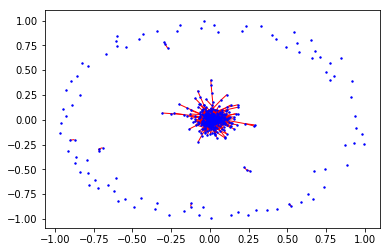

In [25]:
nx.draw_networkx(G,node_color='b',edge_color='r',node_size= 2, with_labels=False,pos= nx.spring_layout(G))
plt.show()


In [26]:
from networkx.algorithms.community import k_clique_communities

In [27]:
#k_clique = list(k_clique_communities(G, 7))

In [28]:
subgraphs = list(nx.connected_component_subgraphs(G))

In [29]:
subgraphs[0]

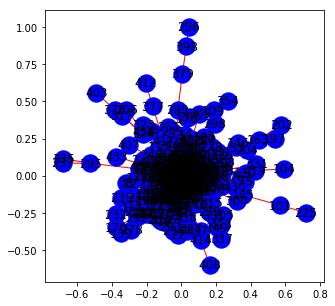

In [30]:
plt.figure(figsize=[5,5])
nx.draw_networkx(subgraphs[1],node_color='b',edge_color='r',with_labels=True,pos= nx.spring_layout(subgraphs[1]))
plt.show()

In [31]:
import graphistry
graphistry.register(key='370c9675be7ab15766e38af1906aa8e77a1265cbcf26256dcc1eb6c223e5bf40')


In [32]:
graphistry.nodes(subgraphs[1].nodes()).edges(subgraphs[0].edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(subgraphs[1])


In [33]:
strongest_community = subgraphs[1].nodes()

In [34]:
len(strongest_community)

353

### Using_identifier

In [35]:
parsed_meta = pd.read_csv('/Users/zhenchensu/Documents/GitHub/semester-project/data/Parsed_metadata.csv')


In [36]:
parsed_meta.head()

,Unnamed: 0,file,subject,iso,uri,type,publisher,title,issued,accessioned,citation,available,abstract,long_name,author_order,shortend_names,identifier
0,0,2015_import_197,"['emergent leadership', 'small group online le...",en,https://doi.dx.org/10.22318/cscl2015.197,Book chapter,International Society of the Learning Science...,"The Role of Time, Engagement, and Self-Perceiv...",2015-07,2017-06-19 14:15:51+00:00,"Xie, K., Sun, Z., & Lu, L. (2015). The Role of...",2017-06-19 14:15:51+00:00,The study investigated the nature of leadershi...,"Xie, Kui",0,Xie K.,"Xie, K., Sun, Z., & Lu, L. (2015). The Role of..."
1,1,2018_import_224,"['equity', 'mathematics learning', 'race']",en,https://doi.dx.org/10.22318/cscl2018.1021,Book chapter,International Society of the Learning Science...,Math: It’s Not What You “Think”,2018-07,2018-11-04 23:26:23+00:00,"Gutiérrez, J. (2018). Math: It’s Not What You ...",2018-11-04 23:26:23+00:00,This paper presents an emerging pedagogical ap...,"Gutiérrez, José",0,Gutiérrez J.,"Gutiérrez, J. (2018). Math: It’s Not What You ..."
2,2,2018_import_249,[],en,https://doi.dx.org/10.22318/cscl2018.1121,Book chapter,International Society of the Learning Science...,“It Didn’t Really Go Very Well”: Epistemologic...,2018-07,2018-11-04 23:26:23+00:00,"Thoma, S., Deitrick, E., & Wilkerson, M. (2018...",2018-11-04 23:26:23+00:00,NaN,"Thoma, Serena",0,Thoma S.,"Thoma, S., Deitrick, E., & Wilkerson, M. (2018..."
3,3,2018_import_254,"['justice', 'mathematics education', 'whiteness']",en,https://doi.dx.org/10.22318/cscl2018.1141,Book chapter,International Society of the Learning Science...,Missing the Brilliance of Scholars of Color: M...,2018-07,2018-11-04 23:26:23+00:00,"Scroggins, A. D., Hand, V., Bartell, T., Byun,...",2018-11-04 23:26:23+00:00,"In this paper, we describe and critically exam...","Scroggins, Ashley D",0,Scroggins A. D.,"Scroggins, A. D., Hand, V., Bartell, T., Byun,..."
4,4,2018_import_80,"['game-based learning', 'design-based research...",en,https://doi.dx.org/10.22318/cscl2018.648,Book chapter,International Society of the Learning Science...,Teacher Practice Spaces: Examples and Design C...,2018-07,2018-11-04 23:14:21+00:00,"Reich, J., Kim, Y. J., Robinson, K., Roy, D., ...",2018-11-04 23:14:21+00:00,Teacher practice spaces are learning environme...,"Reich, Justin",0,Reich J.,"Reich, J., Kim, Y. J., Robinson, K., Roy, D., ..."


In [37]:
dict_matching_unique = dict(zip(parsed_meta['file'],parsed_meta['identifier']))

In [38]:
# dict_matching_unique.keys()

In [39]:
def matching (x) : 
    #x = x.replace('_','/')
    try :
        if x in nans.values: 
            #x = x.replace('/','_')
            #print('nan_on {}'.format(x))
            return dict_matching[x[5:]]
        else :
            return dict_matching_unique[x]
    except KeyError:
        print('key_error on {}'.format(x))
        x = x.replace('/','_')
        return dict_matching[x]

In [40]:
nans = parsed_meta[parsed_meta['identifier'].isnull()]['file']

In [41]:
references_df['identifier_title'] = references_df['file'].apply(lambda x : matching(x))

In [42]:
references_df['identifier_title'][0]

'Bush, J. & Milne, B. (2018). Making Mathematical Thinking Visible Through Technology'

In [43]:
references_df.to_csv('references_nour.csv')

In [44]:
references_df['identifier_title'] = references_df['identifier_title'].apply(lambda x : x.lower())

### Doc  References graph 

In [45]:
#nodes_doc_ref = set(references_df.identifier_title).union(set(references_df.identifier))

In [46]:
groups = references_df.groupby(by = 'identifier_title')

In [47]:
groups.get_group('Swanson, R. D., Hinojosa, L., & Polman, J. L. (2018). Learning Scientific Practices Through Participation as a Volunteer Community Scientist'.lower())


,Unnamed: 0,ref,file,ref_parsed,pub_year,year,identifier,titles,identifier_title
4626,4630,"Lave, J., & Wenger, E. (1991). Situated learni...",2018_import_371,"Lave, J., & Wenger, E. (1991)",2018,1991.0,"lave, j., & wenger, e. (1991). situated learni...",Learning Scientific Practices Through Particip...,"swanson, r. d., hinojosa, l., & polman, j. l. ..."
4627,4631,"Miles, M. B., Huberman, A. M., & Saldana, J. (...",2018_import_371,"Miles, M. B., Huberman, A. M., & Saldana, J. (...",2018,2013.0,"miles, m. b., huberman, a. m., & saldana, j. (...",Learning Scientific Practices Through Particip...,"swanson, r. d., hinojosa, l., & polman, j. l. ..."
4628,4632,"Pea, R. D., Gomez, L. M., Edelson, D. C., Fish...",2018_import_371,"Pea, R. D., Gomez, L. M., Edelson, D. C., Fish...",2018,1997.0,"pea, r. d., gomez, l. m., edelson, d. c., fish...",Learning Scientific Practices Through Particip...,"swanson, r. d., hinojosa, l., & polman, j. l. ..."
4629,4633,"Rogoff, B. (1995). Observing sociocultural act...",2018_import_371,"Rogoff, B. (1995)",2018,1995.0,"rogoff, b. (1995). observing sociocultural act...",Learning Scientific Practices Through Particip...,"swanson, r. d., hinojosa, l., & polman, j. l. ..."
4630,4634,"Shirk, J., Ballard, H., Wilderman, C., Phillip...",2018_import_371,"Shirk, J., Ballard, H., Wilderman, C., Phillip...",2018,2012.0,"shirk, j., ballard, h., wilderman, c., phillip...",Learning Scientific Practices Through Particip...,"swanson, r. d., hinojosa, l., & polman, j. l. ..."


In [48]:
references_df.groupby('identifier').count()[references_df.groupby('identifier').count()['year']>10]

,Unnamed: 0,ref,file,ref_parsed,pub_year,year,titles,identifier_title
identifier,,,,,,,,
"barron, b. (2003). when smart groups fail",13,13,13,13,13,13,13,13
"jordan, b., & henderson, a. (1995). interaction analysis: foundations and practice",22,22,22,22,22,22,22,22
"lave, j., & wenger, e. (1991). situated learning: legitimate peripheral participation",20,20,20,20,20,20,20,20
"national research council. (2012). a framework for k-12 science education: practices, crosscutting concepts, and core ideas",17,17,17,17,17,17,17,17
"ngss lead states. (2013). next generation science standards: for states, by states",16,16,16,16,16,16,16,16
"papert, s. (1980). mindstorms: children, computers, and powerful ideas",17,17,17,17,17,17,17,17
"scardamalia, m. (2002). collective cognitive responsibility for the advancement of knowledge",14,14,14,14,14,14,14,14


In [49]:
#groups.get_group('Kolowich, S. (2013, May 1). Faculty backlash grows against online partners')

In [50]:
#graph.items
graph = dict()
for title in references_df.identifier_title: 
    try : 
        graph[title] = list(groups.get_group(title).identifier)
    except KeyError:
        graph[title] = []

In [51]:
count = 0
for key, value in graph.items():
    if 'Wenger, E. (1998). Communities of practice: Learning, meaning, and identity'.lower() in value:
        count = count + 1

In [52]:
count

9

In [53]:
graph['Swanson, R. D., Hinojosa, L., & Polman, J. L. (2018). Learning Scientific Practices Through Participation as a Volunteer Community Scientist'.lower()]

['lave, j., & wenger, e. (1991). situated learning: legitimate peripheral participation',
 'miles, m. b., huberman, a. m., & saldana, j. (2013). qualitative data analysis: a methods sourcebook',
 'pea, r. d., gomez, l. m., edelson, d. c., fishman, b. j., gordin, d. n., & o’neill, d. k. (1997). science education as a driver of cyberspace technology development',
 'rogoff, b. (1995). observing sociocultural activity on three planes: participatory appropriation, guided participation, and apprenticeship',
 'shirk, j., ballard, h., wilderman, c., phillips, t., wiggins, a., jordan, r., ... & bonney, r. (2012). public participation in scientific research: a framework for deliberate design']

In [54]:
graph = dict()
for title in references_df.identifier_title: 
    try : 
        graph[title] = list(groups.get_group(title).identifier)
    except KeyError:
        graph[title] = []

In [55]:
G_doc = nx.DiGraph(graph)

In [56]:
see = G_doc.degree()
list(see)

[('bryman a. (2012). social research methods', 1),
 ('kafai, y., & resnick, m., (1996). constructionism in practice: designing, thinking, and learning in a digital world',
  1),
 ('chi, m. t., de leeuw, n., chiu, m. h., & lavancher, c. (1994). eliciting self-explanations improves understanding',
  1),
 ('page, s. e. (2007). making the difference: applying a logic of diversity',
  1),
 ('damşa, c. i., kirschner, p. a., andriessen, j. e. b., erkens, g., & sins, p. h. m. (2010). shared epistemic agency: an empirical study of an emergent construct',
  1),
 ('white, s. l. (2018). beyond analogy: qualitative dimensions of comparing in math class',
  10),
 ('rumberger, r. w. (2011). dropping out: why students drop out of high school and what can be done about it',
  1),
 ('davidsen, j. (2014). second graders’ collaborative learning around touchscreens in their classroom: microstudies of eight and nine year old children’s embodied collaborative interactions in front of a touchscreen',
  1),
 (

In [57]:
for key in list(see):
    if key[0]== 'Wenger, E. (1998). Communities of practice: Learning, meaning, and identity':
        print('hey')

In [58]:
len(set(G_doc.nodes()))

6914

In [59]:
import operator

In [60]:
sorted(dict(see).items(), key=operator.itemgetter(1),reverse=True)

[('margulieux, l. e., mccracken, w. m., & catrambone, r. (2015). mixing in-class and online learning: content meta-analysis of outcomes for hybrid, blended, and flipped courses in  lindwall, o',
  77),
 ('uttamchandani, s. (2018). equity in the learning sciences: recent themes and pathways',
  56),
 ('yoon, s., anderson, c. w., baker-doyle, k. j., de laat, m., de los santos, e. x., frank, k. a., hopkins, m., lin, q., marshall, s. m., miller, k. a., nijland, f., penuel, b., shirrell, m., santo, r., schreurs, b., spillane, j., van amersfoort, d., & whitfield, l. c. (2018). networked by design: interventions for teachers to develop social capital',
  51),
 ("sharon, a. j. & baram-tsabari, a. (2018). experts' goals and constraints when discussing vaccines with laypeople on a facebook group",
  51),
 ('flood, v. j., neff, m., & abrahamson, d. (2015). boundary interactions: resolving interdisciplinary collaboration challenges using digitized embodied performances in  lindwall, o',
  48),
 ('

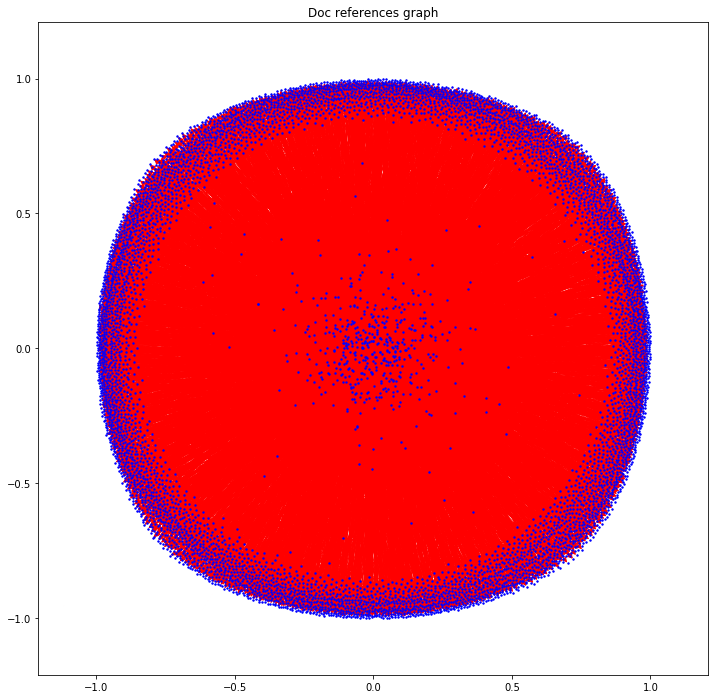

In [62]:
plt.figure(figsize = (12,12))
nx.draw_networkx(G_doc,node_color='b',edge_color='r',node_size= 2, with_labels=False,pos= nx.spring_layout(G_doc))
plt.title('Doc references graph')
plt.show()


In [63]:
graphistry.nodes(G_doc.nodes()).edges(G_doc.edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(G_doc)

In [64]:
import operator
most_cited = nx.pagerank(G_doc)
most_cited = sorted(most_cited.items(), key=operator.itemgetter(1),reverse=True)
most_cited

[('jordan, b., & henderson, a. (1995). interaction analysis: foundations and practice',
  0.00037513099103760885),
 ('lave, j., & wenger, e. (1991). situated learning: legitimate peripheral participation',
  0.0003647987766688744),
 ('papert, s. (1980). mindstorms: children, computers, and powerful ideas',
  0.00030753982920584007),
 ('national research council. (2012). a framework for k-12 science education: practices, crosscutting concepts, and core ideas',
  0.00030066563157669246),
 ('scardamalia, m. (2002). collective cognitive responsibility for the advancement of knowledge',
  0.0002882955186348064),
 ('ngss lead states. (2013). next generation science standards: for states, by states',
  0.0002752186397690088),
 ('wenger, e. (1998). communities of practice: learning, meaning, and identity',
  0.0002578904115515),
 ('oshima, j., oshima, r., & matsuzawa, y. (2012). knowledge building discourse explorer: a social network analysis application for knowledge building discourse',
  0.

In [65]:
indeg = nx.in_degree_centrality(G_doc)

In [66]:
indeg = sorted(indeg.items(), key=operator.itemgetter(1),reverse=True)
indeg

[('jordan, b., & henderson, a. (1995). interaction analysis: foundations and practice',
  0.003182409952263851),
 ('lave, j., & wenger, e. (1991). situated learning: legitimate peripheral participation',
  0.002893099956603501),
 ('papert, s. (1980). mindstorms: children, computers, and powerful ideas',
  0.0024591349631129756),
 ('national research council. (2012). a framework for k-12 science education: practices, crosscutting concepts, and core ideas',
  0.0024591349631129756),
 ('ngss lead states. (2013). next generation science standards: for states, by states',
  0.0023144799652828007),
 ('scardamalia, m. (2002). collective cognitive responsibility for the advancement of knowledge',
  0.0020251699696224507),
 ('barron, b. (2003). when smart groups fail', 0.0018805149717922756),
 ('engle, r. a., & conant, f. r. (2002). guiding principles for fostering productive disciplinary engagement: explaining an emergent argument in a community of learners classroom',
  0.0014465499783017505)

In [67]:
graph['Swanson, R. D., Hinojosa, L., & Polman, J. L. (2018). Learning Scientific Practices Through Participation as a Volunteer Community Scientist'.lower()]

['lave, j., & wenger, e. (1991). situated learning: legitimate peripheral participation',
 'miles, m. b., huberman, a. m., & saldana, j. (2013). qualitative data analysis: a methods sourcebook',
 'pea, r. d., gomez, l. m., edelson, d. c., fishman, b. j., gordin, d. n., & o’neill, d. k. (1997). science education as a driver of cyberspace technology development',
 'rogoff, b. (1995). observing sociocultural activity on three planes: participatory appropriation, guided participation, and apprenticeship',
 'shirk, j., ballard, h., wilderman, c., phillips, t., wiggins, a., jordan, r., ... & bonney, r. (2012). public participation in scientific research: a framework for deliberate design']

### Co-citations in conferences 

In [68]:
graph_in_conf = dict()
in_conf = set(references_df['identifier_title'].apply(lambda x : x.lower()))
for title in in_conf:
    l = set()
    for elem in groups.get_group(title).identifier:
        if elem in in_conf : 
            l.add(elem)
    graph_in_conf[title] = l

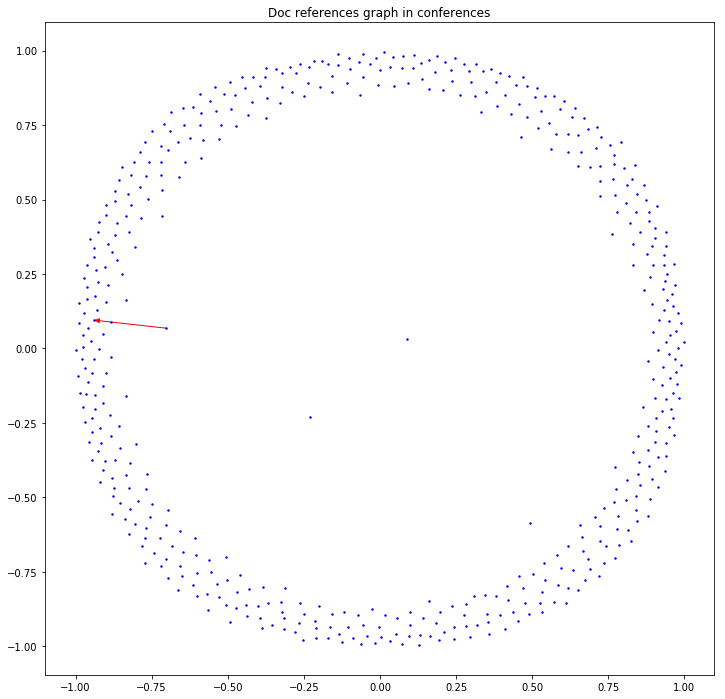

In [69]:
G_inconf = nx.DiGraph(graph_in_conf)
plt.figure(figsize = (12,12))
nx.draw_networkx(G_inconf,node_color='b',edge_color='r',node_size= 2, with_labels=False,pos= nx.spring_layout(G_inconf))
plt.title('Doc references graph in conferences')
plt.show()

In [70]:
len(G_inconf.edges())

1

### Third graph

If doc cites a and b there is a link between a and b

In [71]:
from tqdm import tqdm
def create_pairs (groups):
    weights= dict()
    list_of_pairs = set()
    for i,title in enumerate(set(references_df['identifier_title'])):
        seen = set()
        group = groups.get_group(title)['identifier']
        for elem in group : 
            for elem2 in group: 
                if elem != elem2: 
                    if (((elem,elem2)) in list_of_pairs) and ((elem,elem2)) not in seen:
                        w = weights[(elem,elem2)] 
                        weights[(elem,elem2)] = w+1
                    else : 
                        if ((elem2,elem) not in list_of_pairs):
                            seen.add((elem,elem2))
                            weights[(elem,elem2)] = 1 
                            list_of_pairs.add((elem,elem2))
    return weights

In [72]:
weights = create_pairs(groups)

In [73]:
#weights

In [74]:
graph_3 = nx.Graph()
graph_3.add_nodes_from(list(set(references_df.identifier)))
#weighted_edges = list(map(lambda x: (x[0][0],x[0][1],x[1]),weights.items()))
graph_3.add_weighted_edges_from(list(map(lambda x: (x[0][0],x[0][1],x[1]),weights.items())))

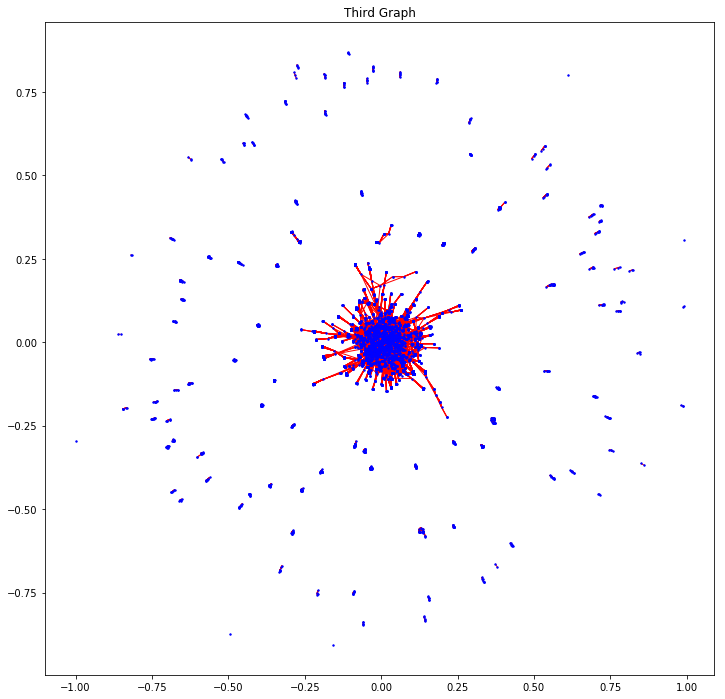

In [75]:
#G_3 =nx.Graph(graph_3)
plt.figure(figsize = (12,12))
nx.draw_networkx(graph_3,node_color='b',edge_color='r',node_size= 2, with_labels=False,pos= nx.spring_layout(graph_3), )
plt.title('Third Graph')
plt.show()

In [76]:
graphistry.nodes(graph_3.nodes()).edges(graph_3.edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(graph_3)

### Graph 4

In [77]:
dict_documents = dict()
for i,elem in enumerate(set(references_df['identifier_title'])):
    dict_documents[elem] = list(set(references_df[references_df['identifier_title'] == elem].identifier))
    

In [78]:
pairs = []
weights_g4 = dict()
for i,doc1 in enumerate(dict_documents.keys()):
    for j,doc2 in enumerate(dict_documents.keys()):
        intersection = set(dict_documents[doc1])&set(dict_documents[doc2])
        if i!=j and (intersection!=set()): 
            if (((doc1,doc2)) not in pairs):
                pairs.append((doc1,doc2))
                weights_g4[(doc1,doc2)] = len(intersection)
            
            

In [79]:
weights_g4_mod = {k: v for k, v in weights_g4.items() if v > 2}

In [80]:
G_intersection = nx.Graph()
G_intersection.add_weighted_edges_from(list(map(lambda x : (x[0][0],x[0][1],x[1]),weights_g4)))

In [81]:
#G_intersection = nx.Graph()
#G_intersection.add_nodes_from(dict_documents.keys())
#G_intersection.add_edges_from(pairs)

In [82]:
graphistry.nodes(G_intersection.nodes()).edges(G_intersection.edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(G_intersection)

### Analysis

### First Graph

The First graph, is a directed graph constructed in this way. For each document, if the document cites another document than there is a link between the document and the cited one. 
From this graph we can see which are the document that are the most cited with the in-degree of each node. 
We can also try to run pagerank algorithm and betweeness centrality algorithm and see if we get the same results. 


### PageRank

In [83]:
pd.DataFrame(sorted(nx.pagerank(G_doc).items(), key=operator.itemgetter(1),reverse=True),columns=['Document','Score']).head(10)

,Document,Score
0,"jordan, b., & henderson, a. (1995). interactio...",0.000375
1,"lave, j., & wenger, e. (1991). situated learni...",0.000365
2,"papert, s. (1980). mindstorms: children, compu...",0.000308
3,national research council. (2012). a framework...,0.000301
4,"scardamalia, m. (2002). collective cognitive r...",0.000288
5,ngss lead states. (2013). next generation scie...,0.000275
6,"wenger, e. (1998). communities of practice: le...",0.000258
7,"oshima, j., oshima, r., & matsuzawa, y. (2012)...",0.000254
8,"scardamalia, m., & bereiter, c. (2014). knowle...",0.000253
9,"barnett, c. (2005).",0.000252


In [84]:
def get_in_deg(G_):
    dict_ = dict(G_.in_degree())
    return pd.DataFrame(sorted(dict_.items(), key=operator.itemgetter(1),reverse=True), columns=['Document','In_degree'])

In [85]:
pd.options.display.max_colwidth = 150
in_degree = get_in_deg(G_doc)
in_degree.head(10)

,Document,In_degree
0,"jordan, b., & henderson, a. (1995). interaction analysis: foundations and practice",22
1,"lave, j., & wenger, e. (1991). situated learning: legitimate peripheral participation",20
2,"papert, s. (1980). mindstorms: children, computers, and powerful ideas",17
3,"national research council. (2012). a framework for k-12 science education: practices, crosscutting concepts, and core ideas",17
4,"ngss lead states. (2013). next generation science standards: for states, by states",16
5,"scardamalia, m. (2002). collective cognitive responsibility for the advancement of knowledge",14
6,"barron, b. (2003). when smart groups fail",13
7,"engle, r. a., & conant, f. r. (2002). guiding principles for fostering productive disciplinary engagement: explaining an emergent argument in a co...",10
8,"bang, m., & vossoughi, s. (2016). participatory design research and educational justice: studying learning and relations within social change making",9
9,"wenger, e. (1998). communities of practice: learning, meaning, and identity",9


In [86]:
graphistry.nodes(G_doc.nodes()).edges(G_doc.edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(G_doc)

### Analysis over years 

The distribution of the references over the years is represented by the graph below 

In [87]:
years = references_df['year'][~references_df['year'].isnull()].apply(lambda x : int(x))

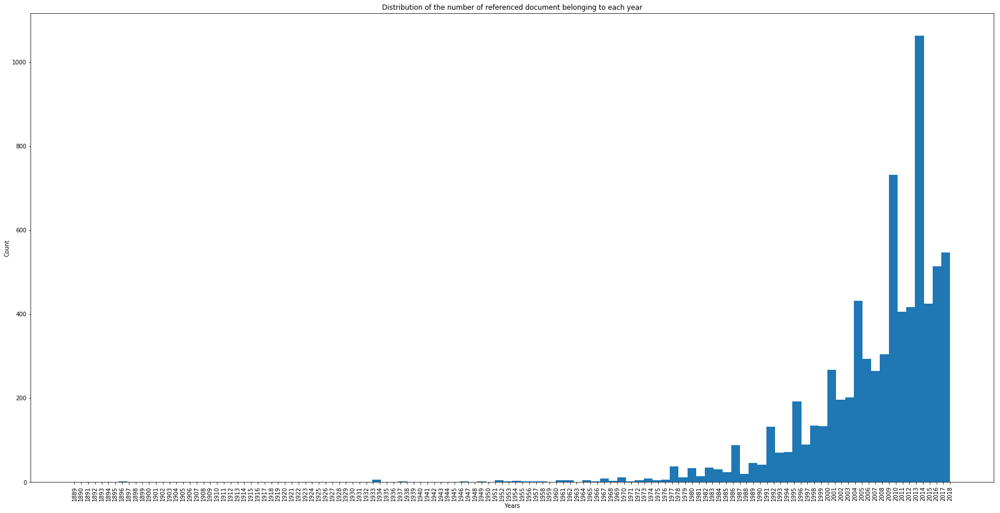

In [88]:
import matplotlib.pyplot as plt

plt.figure(figsize=(30,15))
x = plt.xticks(np.arange(min(years), max(years)+1, 1))
x = plt.hist(years, bins = 100)
plt.title('Distribution of the number of referenced document belonging to each year')
plt.xlabel('Years')
plt.ylabel('Count')
x =plt.xticks(rotation=90)
plt.savefig('distribution_referenced.png')




In [89]:
in_degree.head(10)

,Document,In_degree
0,"jordan, b., & henderson, a. (1995). interaction analysis: foundations and practice",22
1,"lave, j., & wenger, e. (1991). situated learning: legitimate peripheral participation",20
2,"papert, s. (1980). mindstorms: children, computers, and powerful ideas",17
3,"national research council. (2012). a framework for k-12 science education: practices, crosscutting concepts, and core ideas",17
4,"ngss lead states. (2013). next generation science standards: for states, by states",16
5,"scardamalia, m. (2002). collective cognitive responsibility for the advancement of knowledge",14
6,"barron, b. (2003). when smart groups fail",13
7,"engle, r. a., & conant, f. r. (2002). guiding principles for fostering productive disciplinary engagement: explaining an emergent argument in a co...",10
8,"bang, m., & vossoughi, s. (2016). participatory design research and educational justice: studying learning and relations within social change making",9
9,"wenger, e. (1998). communities of practice: learning, meaning, and identity",9


In [90]:
references_df

,Unnamed: 0,ref,file,ref_parsed,pub_year,year,identifier,titles,identifier_title
0,0,"Black, P., & Wiliam, D. (2009). Developing the theory of formative assessment. Educational Assessment, Evaluation and Accountability, 21(1), 5–31.",2018_import_480,"Black, P., & Wiliam, D. (2009)",2018,2009.0,"black, p., & wiliam, d. (2009). developing the theory of formative assessment","Making Mathematical Thinking Visible Through Technology\nJeffrey B. Bush, University of Colorado, Boulder, jeffrey.bush@colorado.edu\nBrent Milne,...","bush, j. & milne, b. (2018). making mathematical thinking visible through technology"
1,1,"Borko, H., Mayfield, V., Marion, S., Flexer, R., & Cumbo, K. (1997). Teachers’ Developing Ideas and Practices about Mathematics Performance Assess...",2018_import_480,"Borko, H., Mayfield, V., Marion, S., Flexer, R., & Cumbo, K. (1997)",2018,1997.0,"borko, h., mayfield, v., marion, s., flexer, r., & cumbo, k. (1997). teachers’ developing ideas and practices about mathematics performance assess...","Making Mathematical Thinking Visible Through Technology\nJeffrey B. Bush, University of Colorado, Boulder, jeffrey.bush@colorado.edu\nBrent Milne,...","bush, j. & milne, b. (2018). making mathematical thinking visible through technology"
2,2,"Carpenter, T. P., Fennema, E., & Franke, M. L. (1996). Cognitively Guided Instruction: A Knowledge Base for Reform in Primary Mathematics Instruct...",2018_import_480,"Carpenter, T. P., Fennema, E., & Franke, M. L. (1996)",2018,1996.0,"carpenter, t. p., fennema, e., & franke, m. l. (1996). cognitively guided instruction: a knowledge base for reform in primary mathematics instruction","Making Mathematical Thinking Visible Through Technology\nJeffrey B. Bush, University of Colorado, Boulder, jeffrey.bush@colorado.edu\nBrent Milne,...","bush, j. & milne, b. (2018). making mathematical thinking visible through technology"
3,3,"Cobb, P., Wood, T., & Yackel, E. (1993). Discourse, mathematical thinking, and classroom. Contexts for Learning: Sociocultural Dynamics in Childre...",2018_import_480,"Cobb, P., Wood, T., & Yackel, E. (1993)",2018,1993.0,"cobb, p., wood, t., & yackel, e. (1993). discourse, mathematical thinking, and classroom","Making Mathematical Thinking Visible Through Technology\nJeffrey B. Bush, University of Colorado, Boulder, jeffrey.bush@colorado.edu\nBrent Milne,...","bush, j. & milne, b. (2018). making mathematical thinking visible through technology"
4,4,"De Corte, E. (1995). Fostering cognitive growth: A perspective from research on mathematics learning and instruction. Educational Psychologist, 30...",2018_import_480,"De Corte, E. (1995)",2018,1995.0,"de corte, e. (1995). fostering cognitive growth: a perspective from research on mathematics learning and instruction","Making Mathematical Thinking Visible Through Technology\nJeffrey B. Bush, University of Colorado, Boulder, jeffrey.bush@colorado.edu\nBrent Milne,...","bush, j. & milne, b. (2018). making mathematical thinking visible through technology"
5,5,"Nasir, N. S., Hand, V., & Taylor, E. V. (2008). Culture and Mathematics in School: Boundaries Between “Cultural” and “Domain” Knowledge in the Mat...",2018_import_480,"Nasir, N. S., Hand, V., & Taylor, E. V. (2008)",2018,2008.0,"nasir, n. s., hand, v., & taylor, e. v. (2008). culture and mathematics in school: boundaries between “cultural” and “domain” knowledge in the mat...","Making Mathematical Thinking Visible Through Technology\nJeffrey B. Bush, University of Colorado, Boulder, jeffrey.bush@colorado.edu\nBrent Milne,...","bush, j. & milne, b. (2018). making mathematical thinking visible through technology"
6,6,"Penuel, W., & Shepard, L. A. (2008). Assessment and Teaching Science. International Journal of Learning (Vol. 15).",2018_import_480,"Penuel, W., & Shepard, L. A. (2008)",2018,2008.0,"penuel, w., & shepard, l. a. (2008). assessment and teaching science","Making Mathematical Thinking Visible Through Technology\nJeffrey B. Bush, University of Colorado, Boulder, 

In [91]:
year = dict(zip(references_df.identifier,references_df.year))

In [92]:
len(references_df.identifier)

7378

In [93]:
references_df.identifier[references_df.identifier == 'knight, s., shibani, a., & buckingham-shum, s. (2018). augmenting formative writing assessment with learning analytics: a design abstraction approach']

Series([], Name: identifier, dtype: object)

In [94]:
def get_year(x):
    try :
        result =  year[x.lower()]
    except KeyError : 
        return 
    return result

In [95]:
in_degree['year'] = in_degree['Document'].apply(get_year)

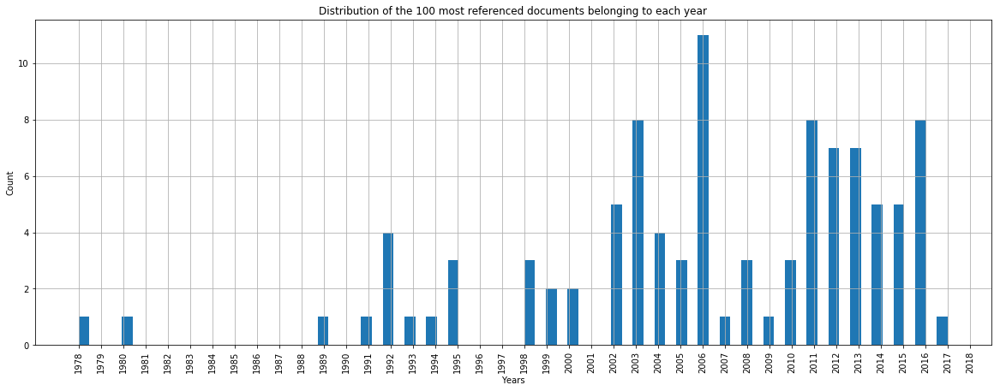

In [96]:
plt.figure(figsize=(20,7))

in_degree['year'][:100].hist(bins = 80)
plt.xticks(rotation=90)

x = plt.xticks(np.arange(min(in_degree['year'][:100]), max(in_degree['year'][:100]+2), 1))
plt.title('Distribution of the 100 most referenced documents belonging to each year')
plt.xlabel('Years')
x = plt.ylabel('Count')
plt.savefig('influencial_count.png')


Most of the most cited documents belongs to 2016 year, more than 12% of the most cited documents belong to this year

### Graph 2 

The Graph 2 is constructed as follows, all the nodes are the references nodes, and the edges are links between documents cited by the same document. Another idea came from this graph, is to create a weighted graph, so that we can see if there some documents that are more likely to be cited together. 


In [97]:
connected_components = list(nx.connected_component_subgraphs(graph_3))

In [98]:
graphistry.nodes(connected_components[0].nodes()).edges(connected_components[0].edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(connected_components[0])

In [99]:
len(connected_components[1].edges())

561

In [100]:
graphistry.nodes(connected_components[1].nodes()).edges(connected_components[1].edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(connected_components[1])

In [101]:
stc = list(nx.strongly_connected_component_subgraphs(graph_3.to_directed()))

In [102]:
graphistry.nodes(stc[0].nodes()).edges(stc[0].edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(stc[0])

Uploading 6621 kB. This may take a while...


In [103]:
len(stc[0].edges())

142924

In [104]:
graphistry.nodes(stc[1].nodes()).edges(stc[1].edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(stc[1])

In [105]:
graphistry.nodes(stc[2].nodes()).edges(stc[2].edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(stc[2])

In [106]:
graphistry.nodes(stc[11].nodes()).edges(stc[11].edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(stc[11])

In [107]:
graphistry.nodes(stc[4].nodes()).edges(stc[4].edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(stc[4])

In [108]:
graphistry.nodes(stc[21].nodes()).edges(stc[21].edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(stc[21])

In [109]:
for i,g in enumerate(stc):
    if i == 0 or i == 15:
        continue
    else : 
        print('************************************************************')
        print('nodes in the ' + str(i)+'th cluster :')
        for elem in g.nodes():
            print(elem)

************************************************************
nodes in the 1th cluster :
bryman a. (2012). social research methods
barkhuus l., lecusay r. (2012). social infrastructures as barriers and foundation for informal learning: technology integration in an urban after-school center
castells, m. (1996). the rise of the network society
friedman, t. l. (2014, october 21). revolution hits the universities
zhao y. & frank k. (2003). factors affecting technology uses in schools: an ecological perspective
oppenheimer t., (2007). the flickering mind: saving education from the false promise of technology
vardi m. y. (2012). will moocs destroy academia
haas c. (1996). writing technologies: studies on the materiality of literacy
eisenberg, m. & fischer, g. (2014) "moocs: a perspective from the learning sciences"
robinson, ken. (2011). out of our minds: learning to be creative: john wiley & sons
nouri j., cerratto-pargman t., rossitto c., ramberg r. (2014). learning with or without mobile d

In [110]:
clusters = dict()
max_ = 0
for i,g in enumerate(stc):
    if len(g.nodes())>1000 or len(g.nodes())<4: 
        continue
    else :
        if max_< len(g.nodes()): 
            print(i)
            max_ = len(g.nodes())
            print(max_)
        clusters['cluster '+ str(i)] = list(g.nodes()) 

1
34
14
66


In [111]:
#list(map(lambda x : len(x[1]),clusters.items()))

In [112]:
clusters_df = pd.DataFrame(pd.DataFrame.from_dict(clusters,orient = 'index').stack())
clusters_df.rename(columns = {0:'Documents'},inplace=True)

In [113]:
clusters_df.rename(columns = {0:'Documents'},inplace=True)

In [114]:
references_df.set_index('identifier').loc[list(clusters_df.loc['cluster 21']['Documents'])]

,Unnamed: 0,ref,file,ref_parsed,pub_year,year,titles,identifier_title
identifier,,,,,,,,
"rothkopf, e. z. (1971). incidental memory for location of information in text",2193,"Rothkopf, E. Z. (1971). Incidental memory for location of information in text. Journal of Verbal Learning and Verbal Behavior, 10(6), 608–613. htt...",2018_import_18,"Rothkopf, E. Z. (1971)",2018,1971.0,"Is Scrolling Disrupting While Reading?\nKatherine Brady, Sun Joo Cho, Gayathri Narasimham, Douglas Fisher, and Amanda Goodwin\nkatherine.a.brady@v...","brady, k., cho, s. j., narasimham, g., fisher, d., & goodwin, a. (2018). is scrolling disrupting while reading"
"buscher, g. (2010). eye tracking analysis of preferred reading regions on the screen",2185,"Buscher, G. (2010). Eye Tracking Analysis of Preferred Reading Regions on the Screen. In CHI’10 Extended Abstracts on Human Factors in Computing S...",2018_import_18,"Buscher, G. (2010)",2018,2010.0,"Is Scrolling Disrupting While Reading?\nKatherine Brady, Sun Joo Cho, Gayathri Narasimham, Douglas Fisher, and Amanda Goodwin\nkatherine.a.brady@v...","brady, k., cho, s. j., narasimham, g., fisher, d., & goodwin, a. (2018). is scrolling disrupting while reading"
"kim, d.-h., & huynh, h. (2008). computer-based and paper-and-pencil administration mode effects on a statewide end-of-course english test",2189,"Kim, D.-H., & Huynh, H. (2008). Computer-based and paper-and-pencil administration mode effects on a statewide end-of-course English test. Educati...",2018_import_18,"Kim, D.-H., & Huynh, H. (2008)",2018,2008.0,"Is Scrolling Disrupting While Reading?\nKatherine Brady, Sun Joo Cho, Gayathri Narasimham, Douglas Fisher, and Amanda Goodwin\nkatherine.a.brady@v...","brady, k., cho, s. j., narasimham, g., fisher, d., & goodwin, a. (2018). is scrolling disrupting while reading"
"weger, u. w., & inhoff, a. w. (2007). long-range regressions to previously read words are guided by spatial and verbal memory",2198,"Weger, U. W., & Inhoff, A. W. (2007). Long-range regressions to previously read words are guided by spatial and verbal memory. Memory & Cognition,...",2018_import_18,"Weger, U. W., & Inhoff, A. W. (2007)",2018,2007.0,"Is Scrolling Disrupting While Reading?\nKatherine Brady, Sun Joo Cho, Gayathri Narasimham, Douglas Fisher, and Amanda Goodwin\nkatherine.a.brady@v...","brady, k., cho, s. j., narasimham, g., fisher, d., & goodwin, a. (2018). is scrolling disrupting while reading"
"kłyszejko, z., soluch, t., wieczorek, a., chmiel, k., sarzyńska, j., & szóstek, a. (2011). the influence of text visualization on the screen on eye movements and information processing",2190,"Kłyszejko, Z., Soluch, T., Wieczorek, A., Chmiel, K., Sarzyńska, J., & Szóstek, A. (2011). The influence of text visualization on the screen on ey...",2018_import_18,"Kłyszejko, Z., Soluch, T., Wieczorek, A., Chmiel, K., Sarzyńska, J., & Szóstek, A. (2011)",2018,2011.0,"Is Scrolling Disrupting While Reading?\nKatherine Brady, Sun Joo Cho, Gayathri Narasimham, Douglas Fisher, and Amanda Goodwin\nkatherine.a.brady@v...","brady, k., cho, s. j., narasimham, g., fisher, d., & goodwin, a. (2018). is scrolling disrupting while reading"
"o’hara, k., & sellen, a. (1997). a comparison of reading paper and on-line documents",2191,"O’Hara, K., & Sellen, A. (1997). A Comparison of Reading Paper and On-Line Documents. In Proceedings of CHI ’97, Human Factors in Computing System...",2018_import_18,"O’Hara, K., & Sellen, A. (1997)",2018,1997.0,"Is Scrolling Disrupting While Reading?\nKatherine Brady, Sun Joo Cho, Gayathri Narasimham, Douglas Fisher, and Amanda Goodwin\nkatherine.a.brady@v...","brady, k., cho, s. j., narasimham, g., fisher, d., & goodwin, a. (2018). is scrolling disrupting while reading"
"hillesund, t. (2010). digital reading spaces: how expert readers handle books, the web and electronic paper",2187,"Hillesund, T. (2010). Digital reading spaces: How expert readers handle books, the Web and electronic paper. First Monday, 15, 1–19. http://doi.or..

#### Closest documents 

Let's see what are the documents that were cited together the most. 

In [115]:
plot_df = pd.DataFrame(list(map(lambda x :(x[0][0],x[0][1],x[1]),sorted(weights.items(), key = operator.itemgetter(1),reverse = True) [:15])))

In [116]:
plot_df.rename(columns = {0 : 'First_document',1:'Second_document',2:'Number_of_times_cited_together'}).head(10)

,First_document,Second_document,Number_of_times_cited_together
0,"national research council. (2012). a framework for k-12 science education: practices, crosscutting concepts, and core ideas","ngss lead states. (2013). next generation science standards: for states, by states",5
1,"bereiter, c. (2002). education and mind in the knowledge age","scardamalia, m. (2002). collective cognitive responsibility for the advancement of knowledge",4
2,"scardamalia, m. (2002). collective cognitive responsibility for the advancement of knowledge","scardamalia, m., & bereiter, c. (2006). knowledge building: theory, pedagogy, and technology",4
3,"lave, j., & wenger, e. (1991). situated learning: legitimate peripheral participation","rogoff, b. (1995). observing sociocultural activity on three planes: participatory appropriation, guided participation, and apprenticeship",4
4,"bang, m., faber, l., gurneau, j., marin, a., & soto, c. (2016). community-based design research: learning across generations and strategic transfo...","bang, m., & vossoughi, s. (2016). participatory design research and educational justice: studying learning and relations within social change making",3
5,"barron, b. (2003). when smart groups fail","roschelle, j. (1992). learning by collaborating: convergent conceptual change",3
6,"colella, v. (2000). participatory simulations: building collaborative understanding through immersive dynamic modeling","hmelo-silver, c. e., & azevedo, r. (2006). understanding complex systems: some core challenges",3
7,"colella, v. (2000). participatory simulations: building collaborative understanding through immersive dynamic modeling","danish, j. a. (2014). applying an activity theory lens to designing instruction for learning about the structure, behavior, and function of a hone...",3
8,"chi, m. t. h. (1997). quantifying qualitative analysis of verbal data: a practical guide","järvelä, s., & hadwin, a. f. (2013). new frontiers: regulating learning in cscl",3
9,"bielaczyc, k., & collins, a. (1999). learning communities in classrooms: a reconceptualization of educational practice","scardamalia, m. (2002). collective cognitive responsibility for the advancement of knowledge",3


### Graph 4 

In [117]:
plus_3 = {k: v for k, v in weights_g4.items() if v>3}

In [118]:
intersection_plus_3 = list(map(lambda x : (x[0][0],x[0][1],x[1]), plus_3.items()))

In [119]:
graph_plus_3 = nx.Graph()
graph_plus_3.add_weighted_edges_from(intersection_plus_3)

In [120]:
graphistry.nodes(graph_plus_3.nodes()).edges(graph_plus_3.edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(graph_plus_3)

In [121]:
stc_doc_clusters = list(nx.strongly_connected_component_subgraphs(G_intersection.to_directed()))
clusters_doc = dict()
i = 0
for g in stc_doc_clusters:
    print(g.nodes)
    if len(g.nodes())>1000 or len(g.nodes())<3: 
        continue
    else :
        if len(g.nodes())>3:
            clusters_doc['cluster '+ str(i)] = list(g.nodes()) 
            i = i+1

['s', 'q', 'n', 'a', "'", 'o', 'j', 'v', 'i', 'd', 't', 'ä', 'z', '̧', 'u', 'x', 'k', 'c', 'g', 'w', 'h', 'r', 'f', 'e', '.', 'p', 'l', 'y', 'm', 'b']


In [122]:
len(stc_doc_clusters)

1

In [123]:
clusters_doc_df = pd.DataFrame(pd.DataFrame.from_dict(clusters_doc,orient = 'index').stack())

In [124]:
clusters_doc_df.head()

0
cluster 0 0  s
          1  q
          2  n
          3  a
          4  '

In [125]:
clusters_doc_df

0
cluster 0 0   s
          1   q
          2   n
          3   a
          4   '
          5   o
          6   j
          7   v
          8   i
          9   d
          10  t
          11  ä
          12  z
          13  ̧
          14  u
          15  x
          16  k
          17  c
          18  g
          19  w
          20  h
          21  r
          22  f
          23  e
          24  .
          25  p
          26  l
          27  y
          28  m
          29  b

In [126]:
import re
p = re.compile(r'--- (\d{4}\.\d{4}\.\d{4}\.\d{4})|(\d{4}/\d{4}/\d{4}/\d{4})')
p.findall('UV0kDHhIISdSbaYFU9u4dVlGTEujDo4t6QbrkCqOkdcMwUTEpmwVLgtA4rKsX cc --- 1094/5333/4444/4544 aOUkhVmYCcL3Mo9eBUgn1S20eBcDpzqsms8AwZCUNDluPGvJMUaIBZbTGkdr7vgzv0gQE3QmkDDlJK8djXbPNZCeCjBFb9Ea763NbQQIhw9BenXNWQRKKhl5A3EinfZGgr20sOBKm8PSWsq8lDQba50yYFdxIHAFpzARbUD0D3OlES3sHS443P1oBTQ2M3xz20miTsLX5ZMEcEOvalK9woZ5JJVKXH6SnlliBZN6sE')[0][1]

'1094/5333/4444/4544'

In [127]:
plots = []
for elem in stc_doc_clusters:
    if len(elem.nodes())>7: 
        plots.append(elem)
    else :
        continue

In [128]:
graphistry.nodes(plots[0].nodes()).edges(plots[0].edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(plots[0])

In [130]:
graphistry.nodes(plots[0].nodes()).edges(plots[0].edges()).settings(url_params={'play': 0}).bind(source='src', destination='dst',node='nodeid').plot(plots[0])


In [131]:
import operator
in_degree_4 = get_in_deg(G_intersection.to_directed())

In [132]:
in_degree_4.head(15)

,Document,In_degree
0,o,19
1,a,18
2,e,18
3,i,16
4,u,16
5,h,13
6,r,12
7,s,11
8,d,8
9,k,8


In [133]:
len(references_df[references_df['identifier_title']=='hod, y., charles, e. s., acosta, a., ben-zvi, d., chen, m., choi, k., dugdale, m., kali, y., lenton, k., mcdonald, s. p., moher, t., quintana, r. m., rook, m. m., slotta, j. d., tietjen, p., weiss, p. l., whittaker, c., zhang, j., bielaczyc, k., & kapur, m. (2016). future learning spaces for learning communities: new directions and conceptual frameworks '])

0

In [134]:
references_df.groupby('identifier_title').count()['ref'].describe()

count    502.000000
mean      14.697211
std       10.982473
min        1.000000
25%        7.000000
50%       11.000000
75%       21.000000
max       77.000000
Name: ref, dtype: float64

In [135]:
#references_df.groupby('identifier_title').count().loc['hod, y., charles, e. s., acosta, a., ben-zvi, d., chen, m., choi, k., dugdale, m., kali, y., lenton, k., mcdonald, s. p., moher, t., quintana, r. m., rook, m. m., slotta, j. d., tietjen, p., weiss, p. l., whittaker, c., zhang, j., bielaczyc, k., & kapur, m. (2016). future learning spaces for learning communities: new directions and conceptual frameworks ']

In [136]:
references_df.groupby('identifier_title').count().loc[in_degree_4['Document'].values]

KeyError: 'None of [[\'o\' \'a\' \'e\' \'i\' \'u\' \'h\' \'r\' \'s\' \'d\' \'k\' \'c\' \'t\' \'p\' \'l\' \'m\' \'b\' \'n\' \'g\'\n \'w\' \'f\' \'y\' \'j\' \'v\' \'z\' \'q\' "\'" \'ä\' \'̧\' \'x\' \'.\']] are in the [index]'

In [137]:
references_df.groupby('identifier_title').count()[references_df.groupby('identifier_title').count()['ref']==154].index

Index([], dtype='object', name='identifier_title')

In [ ]:
in_degree_4[in_degree_4['Document']=='margulieux, l. e., mccracken, w. m., & catrambone, r. (2015). mixing in-class and online learning: content meta-analysis of outcomes for hybrid, blended, and flipped courses in  lindwall, o']